In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import deepchem as dc
# from deepchem.models import DMPNNModel
# from deepchem.models.torch_models.torch_model import DMPNNModel

from sklearn import clone
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.pipeline import make_pipeline
from sklearn.decomposition import PCA
from sklearn.model_selection import cross_val_score

from rdkit import Chem
from rdkit.Chem import MACCSkeys, Descriptors, PandasTools

from tpot import TPOTRegressor

ImportError: cannot import name 'DMPNNModel' from 'deepchem.models' (/home/asasa/.torch/lib/python3.12/site-packages/deepchem/models/__init__.py)

In [2]:
pd.options.display.max_columns = 200

In [3]:
data = pd.read_csv('data_clean.csv', index_col=0)
data.head()

,molecule_chembl_id,Ki,units,pKi,smiles,molecular_weight,n_hba,n_hbd,logp,passed
0,CHEMBL132806,57.0,nM,7.24,CC(C)CCn1cc2c(nc(NC(=O)Cc3ccccc3)n3nc(-c4ccco4...,429.191323,9,1,3.9613,True
1,CHEMBL336217,42.0,nM,7.38,CC(C)CCn1cc2c(nc(NC(=O)Cc3cccc4ccccc34)n3nc(-c...,479.206973,9,1,5.1145,True
2,CHEMBL134566,60.0,nM,7.22,O=C(Cc1ccccc1)Nc1nc2nn(CCCc3ccccc3)cc2c2nc(-c3...,477.191323,9,1,4.5480,True
3,CHEMBL435022,38.0,nM,7.42,CC(C)CCn1cc2c(nc(NC(=O)COc3ccccc3)n3nc(-c4ccco...,445.186238,10,1,3.7976,True
4,CHEMBL341376,423.0,nM,6.37,Cn1cc2c(nc(NC(=O)Cc3ccccc3)n3nc(-c4ccco4)nc23)n1,373.128723,9,1,2.4522,True


In [4]:
data.drop(columns=['molecular_weight', 'n_hba', 'n_hbd', 'logp', 'passed'], inplace=True)
data.head()

,molecule_chembl_id,Ki,units,pKi,smiles
0,CHEMBL132806,57.0,nM,7.24,CC(C)CCn1cc2c(nc(NC(=O)Cc3ccccc3)n3nc(-c4ccco4...
1,CHEMBL336217,42.0,nM,7.38,CC(C)CCn1cc2c(nc(NC(=O)Cc3cccc4ccccc34)n3nc(-c...
2,CHEMBL134566,60.0,nM,7.22,O=C(Cc1ccccc1)Nc1nc2nn(CCCc3ccccc3)cc2c2nc(-c3...
3,CHEMBL435022,38.0,nM,7.42,CC(C)CCn1cc2c(nc(NC(=O)COc3ccccc3)n3nc(-c4ccco...
4,CHEMBL341376,423.0,nM,6.37,Cn1cc2c(nc(NC(=O)Cc3ccccc3)n3nc(-c4ccco4)nc23)n1


In [5]:
PandasTools.AddMoleculeColumnToFrame(data, smilesCol='smiles', molCol='mols')

In [6]:
desc_list = [Descriptors.CalcMolDescriptors(mol) for mol in data['mols'].to_list()]
desc_list

[10:40:35] DEPRECATION WARNING: please use MorganGenerator
[10:40:35] DEPRECATION WARNING: please use MorganGenerator
[10:40:35] DEPRECATION WARNING: please use MorganGenerator
[10:40:35] DEPRECATION WARNING: please use MorganGenerator
[10:40:35] DEPRECATION WARNING: please use MorganGenerator
[10:40:35] DEPRECATION WARNING: please use MorganGenerator
[10:40:35] DEPRECATION WARNING: please use MorganGenerator
[10:40:35] DEPRECATION WARNING: please use MorganGenerator
[10:40:35] DEPRECATION WARNING: please use MorganGenerator
[10:40:35] DEPRECATION WARNING: please use MorganGenerator
[10:40:35] DEPRECATION WARNING: please use MorganGenerator
[10:40:35] DEPRECATION WARNING: please use MorganGenerator
[10:40:35] DEPRECATION WARNING: please use MorganGenerator
[10:40:35] DEPRECATION WARNING: please use MorganGenerator
[10:40:35] DEPRECATION WARNING: please use MorganGenerator
[10:40:35] DEPRECATION WARNING: please use MorganGenerator
[10:40:35] DEPRECATION WARNING: please use MorganGenerat

[{'MaxAbsEStateIndex': 12.722988733448691,
  'MaxEStateIndex': 12.722988733448691,
  'MinAbsEStateIndex': 0.19570459022298792,
  'MinEStateIndex': -0.19570459022298792,
  'qed': 0.41999960655163143,
  'SPS': 11.59375,
  'MolWt': 429.4840000000001,
  'HeavyAtomMolWt': 406.3000000000002,
  'ExactMolWt': 429.1913229760001,
  'NumValenceElectrons': 162,
  'NumRadicalElectrons': 0,
  'MaxPartialCharge': 0.23434541812802862,
  'MinPartialCharge': -0.4609498510953601,
  'MaxAbsPartialCharge': 0.4609498510953601,
  'MinAbsPartialCharge': 0.23434541812802862,
  'FpDensityMorgan1': 1.09375,
  'FpDensityMorgan2': 1.9375,
  'FpDensityMorgan3': 2.6875,
  'BCUT2D_MWHI': 16.333833376858813,
  'BCUT2D_MWLOW': 10.136521012362017,
  'BCUT2D_CHGHI': 2.192353721156717,
  'BCUT2D_CHGLO': -2.0588063752663794,
  'BCUT2D_LOGPHI': 2.240613412769352,
  'BCUT2D_LOGPLOW': -2.178810584094859,
  'BCUT2D_MRHI': 5.945690595089445,
  'BCUT2D_MRLOW': -0.1151791174455246,
  'AvgIpc': 3.5097421273267284,
  'BalabanJ': 1.

In [7]:
desc_df = pd.DataFrame(desc_list)
desc_df

,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,NumRadicalElectrons,MaxPartialCharge,MinPartialCharge,MaxAbsPartialCharge,MinAbsPartialCharge,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_CHGHI,BCUT2D_CHGLO,BCUT2D_LOGPHI,BCUT2D_LOGPLOW,BCUT2D_MRHI,BCUT2D_MRLOW,AvgIpc,BalabanJ,BertzCT,Chi0,Chi0n,Chi0v,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3n,Chi3v,Chi4n,Chi4v,HallKierAlpha,Ipc,Kappa1,Kappa2,Kappa3,LabuteASA,PEOE_VSA1,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,PEOE_VSA14,PEOE_VSA2,PEOE_VSA3,PEOE_VSA4,PEOE_VSA5,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,PEOE_VSA9,SMR_VSA1,SMR_VSA10,SMR_VSA2,SMR_VSA3,SMR_VSA4,SMR_VSA5,SMR_VSA6,SMR_VSA7,SMR_VSA8,SMR_VSA9,SlogP_VSA1,SlogP_VSA10,SlogP_VSA11,SlogP_VSA12,SlogP_VSA2,SlogP_VSA3,SlogP_VSA4,SlogP_VSA5,SlogP_VSA6,SlogP_VSA7,SlogP_VSA8,SlogP_VSA9,TPSA,EState_VSA1,EState_VSA10,EState_VSA11,EState_VSA2,EState_VSA3,EState_VSA4,EState_VSA5,EState_VSA6,EState_VSA7,EState_VSA8,EState_VSA9,VSA_EState1,VSA_EState10,VSA_EState2,VSA_EState3,VSA_EState4,...,NumAliphaticHeterocycles,NumAliphaticRings,NumAromaticCarbocycles,NumAromaticHeterocycles,NumAromaticRings,NumHAcceptors,NumHDonors,NumHeteroatoms,NumRotatableBonds,NumSaturatedCarbocycles,NumSaturatedHeterocycles,NumSaturatedRings,RingCount,MolLogP,MolMR,fr_Al_COO,fr_Al_OH,fr_Al_OH_noTert,fr_ArN,fr_Ar_COO,fr_Ar_N,fr_Ar_NH,fr_Ar_OH,fr_COO,fr_COO2,fr_C_O,fr_C_O_noCOO,fr_C_S,fr_HOCCN,fr_Imine,fr_NH0,fr_NH1,fr_NH2,fr_N_O,fr_Ndealkylation1,fr_Ndealkylation2,fr_Nhpyrrole,fr_SH,fr_aldehyde,fr_alkyl_carbamate,fr_alkyl_halide,fr_allylic_oxid,fr_amide,fr_amidine,fr_aniline,fr_aryl_methyl,fr_azide,fr_azo,fr_barbitur,fr_benzene,fr_benzodiazepine,fr_bicyclic,fr_diazo,fr_dihydropyridine,fr_epoxide,fr_ester,fr_ether,fr_furan,fr_guanido,fr_halogen,fr_hdrzine,fr_hdrzone,fr_imidazole,fr_imide,fr_isocyan,fr_isothiocyan,fr_ketone,fr_ketone_Topliss,fr_lactam,fr_lactone,fr_methoxy,fr_morpholine,fr_nitrile,fr_nitro,fr_nitro_arom,fr_nitro_arom_nonortho,fr_nitroso,fr_oxazole,fr_oxime,fr_para_hydroxylation,fr_phenol,fr_phenol_noOrthoHbond,fr_phos_acid,fr_phos_ester,fr_piperdine,fr_piperzine,fr_priamide,fr_prisulfonamd,fr_pyridine,fr_quatN,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,12.722989,12.722989,0.195705,-0.195705,0.420000,11.593750,429.484,406.300,429.191323,162,0,0.234345,-0.460950,0.460950,0.234345,1.093750,1.937500,2.687500,16.333833,10.136521,2.192354,-2.058806,2.240613,-2.178811,5.945691,-0.115179,3.509742,1.554615,1368.166047,22.078775,17.894601,17.894601,15.563683,10.581988,10.581988,8.106059,8.106059,5.138509,5.138509,3.479499,3.479499,-4.01,3.509996e+07,19.924168,8.256663,3.963826,183.640356,4.417151,0.000000,17.054602,17.679924,0.00000,0.000000,14.793129,4.983979,14.598058,5.098682,44.179310,30.034913,12.741600,18.070209,9.211688,28.536098,0.0,29.362521,5.917906,33.233874,5.316789,60.488028,0.0,11.584652,5.316789,5.948339,0.000000,0.000000,35.269701,17.760115,5.917906,25.831748,59.341727,0.000000,28.265231,0.0,103.14,0.000000,4.794537,0.0,18.276341,28.796912,23.915254,4.515398,18.395897,41.210482,39.329584,4.417151,8.873097,0.000000,21.973649,12.793055,1.983352,...,0,0,1,4,5,8,1,9,7,0,0,0,5,3.9613,120.0057,0,0,0,0,0,6,0,0,0,0,1,1,0,0,0,6,1,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,1,0,3,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,13.166677,13.166677,0.199535,-0.200192,0.341105,11.750000,479.544,454.344,479.206973,180,0,0.234345,-0.460950,0.460950,0.234345,1.000000,1.861111,2.694444,16.333838,10.020078,2.196212,-2.081687,2.248244,-2.181040,5.969924,-0.115163,3.617317,1.389637,1690.943579,24.647689,20.049302,20.049302,17.546847,11.992671,11.992671,9.258733,9.258733,6.161946,6.161946,4.317859,4.317859,-4.53,3.155404e+08,21.966968,8.919037,4.084820,206.322020,4.417151,0.000000,17.054602,17.679924,0.00000,0.000000,14.793129,4.983979,14.

I will drop columns which names starts with 'fr_' and replace them with MACCS keys

In [8]:
cols_to_drop = [col for col in desc_df.columns if col.startswith('fr_')]
cols_to_drop, len(cols_to_drop)

(['fr_Al_COO',
  'fr_Al_OH',
  'fr_Al_OH_noTert',
  'fr_ArN',
  'fr_Ar_COO',
  'fr_Ar_N',
  'fr_Ar_NH',
  'fr_Ar_OH',
  'fr_COO',
  'fr_COO2',
  'fr_C_O',
  'fr_C_O_noCOO',
  'fr_C_S',
  'fr_HOCCN',
  'fr_Imine',
  'fr_NH0',
  'fr_NH1',
  'fr_NH2',
  'fr_N_O',
  'fr_Ndealkylation1',
  'fr_Ndealkylation2',
  'fr_Nhpyrrole',
  'fr_SH',
  'fr_aldehyde',
  'fr_alkyl_carbamate',
  'fr_alkyl_halide',
  'fr_allylic_oxid',
  'fr_amide',
  'fr_amidine',
  'fr_aniline',
  'fr_aryl_methyl',
  'fr_azide',
  'fr_azo',
  'fr_barbitur',
  'fr_benzene',
  'fr_benzodiazepine',
  'fr_bicyclic',
  'fr_diazo',
  'fr_dihydropyridine',
  'fr_epoxide',
  'fr_ester',
  'fr_ether',
  'fr_furan',
  'fr_guanido',
  'fr_halogen',
  'fr_hdrzine',
  'fr_hdrzone',
  'fr_imidazole',
  'fr_imide',
  'fr_isocyan',
  'fr_isothiocyan',
  'fr_ketone',
  'fr_ketone_Topliss',
  'fr_lactam',
  'fr_lactone',
  'fr_methoxy',
  'fr_morpholine',
  'fr_nitrile',
  'fr_nitro',
  'fr_nitro_arom',
  'fr_nitro_arom_nonortho',
  'fr_n

In [9]:
desc_df.drop(columns=cols_to_drop, inplace=True)
desc_df.head()

,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,NumRadicalElectrons,MaxPartialCharge,MinPartialCharge,MaxAbsPartialCharge,MinAbsPartialCharge,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_CHGHI,BCUT2D_CHGLO,BCUT2D_LOGPHI,BCUT2D_LOGPLOW,BCUT2D_MRHI,BCUT2D_MRLOW,AvgIpc,BalabanJ,BertzCT,Chi0,Chi0n,Chi0v,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3n,Chi3v,Chi4n,Chi4v,HallKierAlpha,Ipc,Kappa1,Kappa2,Kappa3,LabuteASA,PEOE_VSA1,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,PEOE_VSA14,PEOE_VSA2,PEOE_VSA3,PEOE_VSA4,PEOE_VSA5,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,PEOE_VSA9,SMR_VSA1,SMR_VSA10,SMR_VSA2,SMR_VSA3,SMR_VSA4,SMR_VSA5,SMR_VSA6,SMR_VSA7,SMR_VSA8,SMR_VSA9,SlogP_VSA1,SlogP_VSA10,SlogP_VSA11,SlogP_VSA12,SlogP_VSA2,SlogP_VSA3,SlogP_VSA4,SlogP_VSA5,SlogP_VSA6,SlogP_VSA7,SlogP_VSA8,SlogP_VSA9,TPSA,EState_VSA1,EState_VSA10,EState_VSA11,EState_VSA2,EState_VSA3,EState_VSA4,EState_VSA5,EState_VSA6,EState_VSA7,EState_VSA8,EState_VSA9,VSA_EState1,VSA_EState10,VSA_EState2,VSA_EState3,VSA_EState4,VSA_EState5,VSA_EState6,VSA_EState7,VSA_EState8,VSA_EState9,FractionCSP3,HeavyAtomCount,NHOHCount,NOCount,NumAliphaticCarbocycles,NumAliphaticHeterocycles,NumAliphaticRings,NumAromaticCarbocycles,NumAromaticHeterocycles,NumAromaticRings,NumHAcceptors,NumHDonors,NumHeteroatoms,NumRotatableBonds,NumSaturatedCarbocycles,NumSaturatedHeterocycles,NumSaturatedRings,RingCount,MolLogP,MolMR
0,12.722989,12.722989,0.195705,-0.195705,0.420000,11.593750,429.484,406.300,429.191323,162,0,0.234345,-0.460950,0.460950,0.234345,1.093750,1.937500,2.687500,16.333833,10.136521,2.192354,-2.058806,2.240613,-2.178811,5.945691,-0.115179,3.509742,1.554615,1368.166047,22.078775,17.894601,17.894601,15.563683,10.581988,10.581988,8.106059,8.106059,5.138509,5.138509,3.479499,3.479499,-4.01,3.509996e+07,19.924168,8.256663,3.963826,183.640356,4.417151,0.000000,17.054602,17.679924,0.00000,0.0,14.793129,4.983979,14.598058,5.098682,44.179310,30.034913,12.741600,18.070209,9.211688,28.536098,0.0,29.362521,5.917906,33.233874,5.316789,60.488028,0.0,11.584652,5.316789,5.948339,0.000000,0.0,35.269701,17.760115,5.917906,25.831748,59.341727,0.0,28.265231,0.0,103.14,0.0,4.794537,0.0,18.276341,28.796912,23.915254,4.515398,18.395897,41.210482,39.329584,4.417151,8.873097,0.0,21.973649,12.793055,1.983352,1.584870,13.116448,4.719710,5.122484,0.000000,0.260870,32,1,9,0,0,0,1,4,5,8,1,9,7,0,0,0,5,3.9613,120.0057
1,13.166677,13.166677,0.199535,-0.200192,0.341105,11.750000,479.544,454.344,479.206973,180,0,0.234345,-0.460950,0.460950,0.234345,1.000000,1.861111,2.694444,16.333838,10.020078,2.196212,-2.081687,2.248244,-2.181040,5.969924,-0.115163,3.617317,1.389637,1690.943579,24.647689,20.049302,20.049302,17.546847,11.992671,11.992671,9.258733,9.258733,6.161946,6.161946,4.317859,4.317859,-4.53,3.155404e+08,21.966968,8.919037,4.084820,206.322020,4.417151,0.000000,17.054602,17.679924,0.00000,0.0,14.793129,4.983979,14.598058,5.098682,56.312044,40.807362,12.741600,18.070209,9.211688,39.308546,0.0,29.362521,5.917906,33.233874,5.316789,72.620762,0.0,11.584652,5.316789,5.948339,0.000000,0.0,35.269701,17.760115,5.917906,25.831748,71.474461,0.0,39.037679,0.0,103.14,0.0,4.794537,0.0,18.276341,28.796912,34.687702,0.000000,22.911295,53.343216,34.345605,9.401129,8.932087,0.0,22.520587,15.087962,2.003259,1.559873,17.577432,4.696822,5.121978,0.000000,0.222222,36,1,9,0,0,0,2,4,6,8,1,9,7,0,0,0,6,5.1145,137.5117
2,12.821618,12.821618,0.202137,-0.202137,0.345039,11.333333,477.528,454.344,477.191323,178,0,0.234345,-0.460950,0.460950,0.234345,0.888889,1.666667,2.416667,16.333838,10.114776,2.192185,-2.058658,2.240581,-2.178792,5.945788,-0.115180,3.645490,1.323961,1621.149727,24.321416,19.411109,19.411109,17.725479,11.783276,11.783276,8.512689,8.512689,5.898449,5.898449,4.178885,4.178885,-4.79,4.034290e+08,21.723919,9.455978,4.458031,205.967566,4.417151,0.000000,17.054602,17.679924,0.00000,0.0,14.793129,4.983979,14.598058,5.098682,60.66

Columns with just only one inside

In [10]:
one_val_cols = []
for col in desc_df.columns:
    if desc_df[col].unique().shape == (1,):
        one_val_cols.append(col)

In [11]:
for col in one_val_cols:
    print(desc_df[col].unique())

[0]
[0.]
[0.]
[0.]


In [12]:
print(one_val_cols)

['NumRadicalElectrons', 'SMR_VSA8', 'SlogP_VSA9', 'EState_VSA11']


We can drop all columns with only one value

In [13]:
desc_df.describe()

,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,NumRadicalElectrons,MaxPartialCharge,MinPartialCharge,MaxAbsPartialCharge,MinAbsPartialCharge,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_CHGHI,BCUT2D_CHGLO,BCUT2D_LOGPHI,BCUT2D_LOGPLOW,BCUT2D_MRHI,BCUT2D_MRLOW,AvgIpc,BalabanJ,BertzCT,Chi0,Chi0n,Chi0v,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3n,Chi3v,Chi4n,Chi4v,HallKierAlpha,Ipc,Kappa1,Kappa2,Kappa3,LabuteASA,PEOE_VSA1,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,PEOE_VSA14,PEOE_VSA2,PEOE_VSA3,PEOE_VSA4,PEOE_VSA5,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,PEOE_VSA9,SMR_VSA1,SMR_VSA10,SMR_VSA2,SMR_VSA3,SMR_VSA4,SMR_VSA5,SMR_VSA6,SMR_VSA7,SMR_VSA8,SMR_VSA9,SlogP_VSA1,SlogP_VSA10,SlogP_VSA11,SlogP_VSA12,SlogP_VSA2,SlogP_VSA3,SlogP_VSA4,SlogP_VSA5,SlogP_VSA6,SlogP_VSA7,SlogP_VSA8,SlogP_VSA9,TPSA,EState_VSA1,EState_VSA10,EState_VSA11,EState_VSA2,EState_VSA3,EState_VSA4,EState_VSA5,EState_VSA6,EState_VSA7,EState_VSA8,EState_VSA9,VSA_EState1,VSA_EState10,VSA_EState2,VSA_EState3,VSA_EState4,VSA_EState5,VSA_EState6,VSA_EState7,VSA_EState8,VSA_EState9,FractionCSP3,HeavyAtomCount,NHOHCount,NOCount,NumAliphaticCarbocycles,NumAliphaticHeterocycles,NumAliphaticRings,NumAromaticCarbocycles,NumAromaticHeterocycles,NumAromaticRings,NumHAcceptors,NumHDonors,NumHeteroatoms,NumRotatableBonds,NumSaturatedCarbocycles,NumSaturatedHeterocycles,NumSaturatedRings,RingCount,MolLogP,MolMR
count,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.0,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2.943000e+03,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2.943000e+03,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.0,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.0,2943.000000,2943.000000,2943.000000,2943.0,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.00000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000,2943.000000
mean,10.957153,10.957153,0.193110,-0.443257,0.601305,13.894162,365.316025,347.290191,364.945495,134.145430,0.0,0.262648,-0.420747,0.423471,0.259923,1.116697,1.900455,2.613949,24.488955,10.136080,2.216040,-2.128152,2.279160,-2.211034,6.353155,0.232202,3.152418,1.771505e+00,1039.065385,18.375992,14.424694,14.801925,12.756821,8.400678,8.714003,6.180202,6.527140,4.301361,4.601782,2.991289,3.245235,-3.102097,3.261682e+07,16.721165,6.764176,3.189168,152.972385,12.061078,10.360411,10.542335,5.871296,2.427143,1.886029,6.728049,10.204671,6.203297,2.960437,22.772543,29.520571,17.997066,13.290419,9.037453,23.661495,0.382718,20.392681,2.277712,19.742379,12.564795,52.756473,0.0,12.009638,9.180812,7.689557,1.825033,4.960512,34.147381,8.084736,4.443545,18.187343,44.813668,0.760995,18.731763,0.0,92.529993,4.936042,7.024563,0.0,11.490606,24.592294,17.652229,11.283210,19.241259,25.841875,22.447172,8.316093,9.667682,1.356622,20.348512,9.252908,4.144656,0.813772,10.329208,2.481369,2.160290,0.730102,0.234661,26.311927,1.88651,7.247367,0.2147

In [14]:
desc_df.drop(columns=one_val_cols, inplace=True)
desc_df.head()

,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,MaxPartialCharge,MinPartialCharge,MaxAbsPartialCharge,MinAbsPartialCharge,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_CHGHI,BCUT2D_CHGLO,BCUT2D_LOGPHI,BCUT2D_LOGPLOW,BCUT2D_MRHI,BCUT2D_MRLOW,AvgIpc,BalabanJ,BertzCT,Chi0,Chi0n,Chi0v,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3n,Chi3v,Chi4n,Chi4v,HallKierAlpha,Ipc,Kappa1,Kappa2,Kappa3,LabuteASA,PEOE_VSA1,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,PEOE_VSA14,PEOE_VSA2,PEOE_VSA3,PEOE_VSA4,PEOE_VSA5,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,PEOE_VSA9,SMR_VSA1,SMR_VSA10,SMR_VSA2,SMR_VSA3,SMR_VSA4,SMR_VSA5,SMR_VSA6,SMR_VSA7,SMR_VSA9,SlogP_VSA1,SlogP_VSA10,SlogP_VSA11,SlogP_VSA12,SlogP_VSA2,SlogP_VSA3,SlogP_VSA4,SlogP_VSA5,SlogP_VSA6,SlogP_VSA7,SlogP_VSA8,TPSA,EState_VSA1,EState_VSA10,EState_VSA2,EState_VSA3,EState_VSA4,EState_VSA5,EState_VSA6,EState_VSA7,EState_VSA8,EState_VSA9,VSA_EState1,VSA_EState10,VSA_EState2,VSA_EState3,VSA_EState4,VSA_EState5,VSA_EState6,VSA_EState7,VSA_EState8,VSA_EState9,FractionCSP3,HeavyAtomCount,NHOHCount,NOCount,NumAliphaticCarbocycles,NumAliphaticHeterocycles,NumAliphaticRings,NumAromaticCarbocycles,NumAromaticHeterocycles,NumAromaticRings,NumHAcceptors,NumHDonors,NumHeteroatoms,NumRotatableBonds,NumSaturatedCarbocycles,NumSaturatedHeterocycles,NumSaturatedRings,RingCount,MolLogP,MolMR
0,12.722989,12.722989,0.195705,-0.195705,0.420000,11.593750,429.484,406.300,429.191323,162,0.234345,-0.460950,0.460950,0.234345,1.093750,1.937500,2.687500,16.333833,10.136521,2.192354,-2.058806,2.240613,-2.178811,5.945691,-0.115179,3.509742,1.554615,1368.166047,22.078775,17.894601,17.894601,15.563683,10.581988,10.581988,8.106059,8.106059,5.138509,5.138509,3.479499,3.479499,-4.01,3.509996e+07,19.924168,8.256663,3.963826,183.640356,4.417151,0.000000,17.054602,17.679924,0.00000,0.0,14.793129,4.983979,14.598058,5.098682,44.179310,30.034913,12.741600,18.070209,9.211688,28.536098,0.0,29.362521,5.917906,33.233874,5.316789,60.488028,11.584652,5.316789,5.948339,0.000000,0.0,35.269701,17.760115,5.917906,25.831748,59.341727,0.0,28.265231,103.14,0.0,4.794537,18.276341,28.796912,23.915254,4.515398,18.395897,41.210482,39.329584,4.417151,8.873097,0.0,21.973649,12.793055,1.983352,1.584870,13.116448,4.719710,5.122484,0.000000,0.260870,32,1,9,0,0,0,1,4,5,8,1,9,7,0,0,0,5,3.9613,120.0057
1,13.166677,13.166677,0.199535,-0.200192,0.341105,11.750000,479.544,454.344,479.206973,180,0.234345,-0.460950,0.460950,0.234345,1.000000,1.861111,2.694444,16.333838,10.020078,2.196212,-2.081687,2.248244,-2.181040,5.969924,-0.115163,3.617317,1.389637,1690.943579,24.647689,20.049302,20.049302,17.546847,11.992671,11.992671,9.258733,9.258733,6.161946,6.161946,4.317859,4.317859,-4.53,3.155404e+08,21.966968,8.919037,4.084820,206.322020,4.417151,0.000000,17.054602,17.679924,0.00000,0.0,14.793129,4.983979,14.598058,5.098682,56.312044,40.807362,12.741600,18.070209,9.211688,39.308546,0.0,29.362521,5.917906,33.233874,5.316789,72.620762,11.584652,5.316789,5.948339,0.000000,0.0,35.269701,17.760115,5.917906,25.831748,71.474461,0.0,39.037679,103.14,0.0,4.794537,18.276341,28.796912,34.687702,0.000000,22.911295,53.343216,34.345605,9.401129,8.932087,0.0,22.520587,15.087962,2.003259,1.559873,17.577432,4.696822,5.121978,0.000000,0.222222,36,1,9,0,0,0,2,4,6,8,1,9,7,0,0,0,6,5.1145,137.5117
2,12.821618,12.821618,0.202137,-0.202137,0.345039,11.333333,477.528,454.344,477.191323,178,0.234345,-0.460950,0.460950,0.234345,0.888889,1.666667,2.416667,16.333838,10.114776,2.192185,-2.058658,2.240581,-2.178792,5.945788,-0.115180,3.645490,1.323961,1621.149727,24.321416,19.411109,19.411109,17.725479,11.783276,11.783276,8.512689,8.512689,5.898449,5.898449,4.178885,4.178885,-4.79,4.034290e+08,21.723919,9.455978,4.458031,205.967566,4.417151,0.000000,17.054602,17.679924,0.00000,0.0,14.793129,4.983979,14.598058,5.098682,60.663671,36.101280,12.741600,18.070209,9.211688,28.536098,0.0,29.362521,0.000000,25.807

In [15]:
two_val_cols = []
for col in desc_df.columns:
    if desc_df[col].unique().shape == (2,):
        two_val_cols.append(col)
two_val_cols

[]

In [16]:
three_val_cols = []
for col in desc_df.columns:
    if desc_df[col].unique().shape == (3,):
        three_val_cols.append(col)
three_val_cols

[]

In [17]:
desc_df.nunique()

MaxAbsEStateIndex           2839
MaxEStateIndex              2839
MinAbsEStateIndex           2831
MinEStateIndex              2841
qed                         2486
                            ... 
NumSaturatedHeterocycles       4
NumSaturatedRings              6
RingCount                      8
MolLogP                     2504
MolMR                       2523
Length: 121, dtype: int64

In [18]:
desc_cols = desc_df.columns
desc_cols

Index(['MaxAbsEStateIndex', 'MaxEStateIndex', 'MinAbsEStateIndex',
       'MinEStateIndex', 'qed', 'SPS', 'MolWt', 'HeavyAtomMolWt', 'ExactMolWt',
       'NumValenceElectrons',
       ...
       'NumHAcceptors', 'NumHDonors', 'NumHeteroatoms', 'NumRotatableBonds',
       'NumSaturatedCarbocycles', 'NumSaturatedHeterocycles',
       'NumSaturatedRings', 'RingCount', 'MolLogP', 'MolMR'],
      dtype='object', length=121)

In [19]:
maccs_keys = [MACCSkeys.GenMACCSKeys(mol) for mol in data['mols']]
maccs_keys

 ...]

In [20]:
maccs = pd.DataFrame(np.stack(maccs_keys))
maccs

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,1,0,1,1,1,1,1,0,1,1,0,0,1,1,1,0,0,0,1,1,0,0,0,1,1,1,1,0,1,1,1,0,1,1,0,0,0,0,1,0,1,1,0,1,0,1,0,0,0,0,1,0,0,1,0,1,1,1,0,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,1,0,1,1,1,1,1,0,1,1,0,0,1,1,1,0,0,0,1,1,0,0,0,1,1,1,1,0,1,1,1,0,1,1,0,0,0,0,1,0,1,1,0,1,0,1,0,0,0,0,1,0,0,1,0,1,1,1,0,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,1,0,1,1,1,1,1,0,1,1,0,0,1,1,1,0,0,0,1,1,0,0,0,0,0,1,1,0,1,1,1,0,1,1,0,0,0,0,1,0,1,1,0,1,0,1,0,0,0,0,1,0,0,1,0,1,1,0,0,1,1,1,1,1,1,0,1,1,0,1,1,1,1,1,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,1,1,0,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,1,0,1,1,1,1,1,0,1,1,0,0,1,1,1,0,0,1,1,1,0,1,0,1,1,1,1,0,1,1,1,0,1,1,1,1,0,0,1,0,1,1,0,1,0,1,1,0,0,0,1,1,0,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,0,0,1,0,0,1,1,1,0,0,0,1,1,0,0,0,0,0,1,0,0,1,1,1,0,1,1,0,0,0,0,1,0,1,1,0,1,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1,1,0,1,1,1,0,1,1,1,1,1,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2938,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,1,1,1,1,0,0,0,0,0,0,1,0,0,1,1,1,1,0,1,1,0,1,0,1,0,0,0,0,1,1,0,0,0,0,0,1,0,0,1,1,1,0,0,1,0,0,0,0,0,1,0,1,1,1,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,1,1,1,1,0,1,0,0,1,1,1,1,1,1
2939,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,0,1,0,1,0,1,1,0,1,1,0,1,0,0,0,1,1,1,1,1,0,1,1,1,1,0,1,1,0,0,1,1,1,0,1,0,1,1,1,1,0,0,0,1,1,0,1,1,1,0,0,1,1,1,0,0,0,1,0,1,0,1,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
2940,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,1,1,0,1,0,1,1,0,1,1,0,1,0,0,0,0,1,1,0,1,0,1,1,1,1,0,1,1,0,0,1,1,1,0,0,1,1,1,0,1,0,1,0,1,1,0,1,1,1,0,0,1,1,1,0,0,0,1,0,1,0,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,0
2941,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [21]:
entry = pd.concat([data[['pKi', 'smiles']], desc_df], axis=1)

In [22]:
entry

,pKi,smiles,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,MaxPartialCharge,MinPartialCharge,MaxAbsPartialCharge,MinAbsPartialCharge,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_CHGHI,BCUT2D_CHGLO,BCUT2D_LOGPHI,BCUT2D_LOGPLOW,BCUT2D_MRHI,BCUT2D_MRLOW,AvgIpc,BalabanJ,BertzCT,Chi0,Chi0n,Chi0v,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3n,Chi3v,Chi4n,Chi4v,HallKierAlpha,Ipc,Kappa1,Kappa2,Kappa3,LabuteASA,PEOE_VSA1,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,PEOE_VSA14,PEOE_VSA2,PEOE_VSA3,PEOE_VSA4,PEOE_VSA5,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,PEOE_VSA9,SMR_VSA1,SMR_VSA10,SMR_VSA2,SMR_VSA3,SMR_VSA4,SMR_VSA5,SMR_VSA6,SMR_VSA7,SMR_VSA9,SlogP_VSA1,SlogP_VSA10,SlogP_VSA11,SlogP_VSA12,SlogP_VSA2,SlogP_VSA3,SlogP_VSA4,SlogP_VSA5,SlogP_VSA6,SlogP_VSA7,SlogP_VSA8,TPSA,EState_VSA1,EState_VSA10,EState_VSA2,EState_VSA3,EState_VSA4,EState_VSA5,EState_VSA6,EState_VSA7,EState_VSA8,EState_VSA9,VSA_EState1,VSA_EState10,VSA_EState2,VSA_EState3,VSA_EState4,VSA_EState5,VSA_EState6,VSA_EState7,VSA_EState8,VSA_EState9,FractionCSP3,HeavyAtomCount,NHOHCount,NOCount,NumAliphaticCarbocycles,NumAliphaticHeterocycles,NumAliphaticRings,NumAromaticCarbocycles,NumAromaticHeterocycles,NumAromaticRings,NumHAcceptors,NumHDonors,NumHeteroatoms,NumRotatableBonds,NumSaturatedCarbocycles,NumSaturatedHeterocycles,NumSaturatedRings,RingCount,MolLogP,MolMR
0,7.24,CC(C)CCn1cc2c(nc(NC(=O)Cc3ccccc3)n3nc(-c4ccco4...,12.722989,12.722989,0.195705,-0.195705,0.420000,11.593750,429.484,406.300,429.191323,162,0.234345,-0.460950,0.460950,0.234345,1.093750,1.937500,2.687500,16.333833,10.136521,2.192354,-2.058806,2.240613,-2.178811,5.945691,-0.115179,3.509742,1.554615,1368.166047,22.078775,17.894601,17.894601,15.563683,10.581988,10.581988,8.106059,8.106059,5.138509,5.138509,3.479499,3.479499,-4.01,3.509996e+07,19.924168,8.256663,3.963826,183.640356,4.417151,0.000000,17.054602,17.679924,0.00000,0.000000,14.793129,4.983979,14.598058,5.098682,44.179310,30.034913,12.741600,18.070209,9.211688,28.536098,0.0,29.362521,5.917906,33.233874,5.316789,60.488028,11.584652,5.316789,5.948339,0.000000,0.000000,35.269701,17.760115,5.917906,25.831748,59.341727,0.000000,28.265231,103.14,0.000000,4.794537,18.276341,28.796912,23.915254,4.515398,18.395897,41.210482,39.329584,4.417151,8.873097,0.000000,21.973649,12.793055,1.983352,1.584870,13.116448,4.719710,5.122484,0.000000,0.260870,32,1,9,0,0,0,1,4,5,8,1,9,7,0,0,0,5,3.9613,120.0057
1,7.38,CC(C)CCn1cc2c(nc(NC(=O)Cc3cccc4ccccc34)n3nc(-c...,13.166677,13.166677,0.199535,-0.200192,0.341105,11.750000,479.544,454.344,479.206973,180,0.234345,-0.460950,0.460950,0.234345,1.000000,1.861111,2.694444,16.333838,10.020078,2.196212,-2.081687,2.248244,-2.181040,5.969924,-0.115163,3.617317,1.389637,1690.943579,24.647689,20.049302,20.049302,17.546847,11.992671,11.992671,9.258733,9.258733,6.161946,6.161946,4.317859,4.317859,-4.53,3.155404e+08,21.966968,8.919037,4.084820,206.322020,4.417151,0.000000,17.054602,17.679924,0.00000,0.000000,14.793129,4.983979,14.598058,5.098682,56.312044,40.807362,12.741600,18.070209,9.211688,39.308546,0.0,29.362521,5.917906,33.233874,5.316789,72.620762,11.584652,5.316789,5.948339,0.000000,0.000000,35.269701,17.760115,5.917906,25.831748,71.474461,0.000000,39.037679,103.14,0.000000,4.794537,18.276341,28.796912,34.687702,0.000000,22.911295,53.343216,34.345605,9.401129,8.932087,0.000000,22.520587,15.087962,2.003259,1.559873,17.577432,4.696822,5.121978,0.000000,0.222222,36,1,9,0,0,0,2,4,6,8,1,9,7,0,0,0,6,5.1145,137.5117
2,7.22,O=C(Cc1ccccc1)Nc1nc2nn(CCCc3ccccc3)cc2c2nc(-c3...,12.821618,12.821618,0.202137,-0.202137,0.345039,11.333333,477.528,454.344,477.191323,178,0.234345,-0.460950,0.460950,0.234345,0.888889,1.666667,2.416667,16.333838,10.114776,2.192185,-2.058658,2.240581,-2.178792,5.945788,-0.115180,3.645490,1.323961,1621.149727,24.321416,19.411109,19.411109,17.725479,11.783276,11.783276,8.512689,8.512689,5.898449,5.898449,4.178885,4.178885,-4.79,4.

In [23]:
maccs_cols = [f'maccs_{col}' for col in maccs.columns]
maccs_cols

['maccs_0',
 'maccs_1',
 'maccs_2',
 'maccs_3',
 'maccs_4',
 'maccs_5',
 'maccs_6',
 'maccs_7',
 'maccs_8',
 'maccs_9',
 'maccs_10',
 'maccs_11',
 'maccs_12',
 'maccs_13',
 'maccs_14',
 'maccs_15',
 'maccs_16',
 'maccs_17',
 'maccs_18',
 'maccs_19',
 'maccs_20',
 'maccs_21',
 'maccs_22',
 'maccs_23',
 'maccs_24',
 'maccs_25',
 'maccs_26',
 'maccs_27',
 'maccs_28',
 'maccs_29',
 'maccs_30',
 'maccs_31',
 'maccs_32',
 'maccs_33',
 'maccs_34',
 'maccs_35',
 'maccs_36',
 'maccs_37',
 'maccs_38',
 'maccs_39',
 'maccs_40',
 'maccs_41',
 'maccs_42',
 'maccs_43',
 'maccs_44',
 'maccs_45',
 'maccs_46',
 'maccs_47',
 'maccs_48',
 'maccs_49',
 'maccs_50',
 'maccs_51',
 'maccs_52',
 'maccs_53',
 'maccs_54',
 'maccs_55',
 'maccs_56',
 'maccs_57',
 'maccs_58',
 'maccs_59',
 'maccs_60',
 'maccs_61',
 'maccs_62',
 'maccs_63',
 'maccs_64',
 'maccs_65',
 'maccs_66',
 'maccs_67',
 'maccs_68',
 'maccs_69',
 'maccs_70',
 'maccs_71',
 'maccs_72',
 'maccs_73',
 'maccs_74',
 'maccs_75',
 'maccs_76',
 'maccs_7

In [24]:
maccs.columns = maccs_cols
maccs

,maccs_0,maccs_1,maccs_2,maccs_3,maccs_4,maccs_5,maccs_6,maccs_7,maccs_8,maccs_9,maccs_10,maccs_11,maccs_12,maccs_13,maccs_14,maccs_15,maccs_16,maccs_17,maccs_18,maccs_19,maccs_20,maccs_21,maccs_22,maccs_23,maccs_24,maccs_25,maccs_26,maccs_27,maccs_28,maccs_29,maccs_30,maccs_31,maccs_32,maccs_33,maccs_34,maccs_35,maccs_36,maccs_37,maccs_38,maccs_39,maccs_40,maccs_41,maccs_42,maccs_43,maccs_44,maccs_45,maccs_46,maccs_47,maccs_48,maccs_49,maccs_50,maccs_51,maccs_52,maccs_53,maccs_54,maccs_55,maccs_56,maccs_57,maccs_58,maccs_59,maccs_60,maccs_61,maccs_62,maccs_63,maccs_64,maccs_65,maccs_66,maccs_67,maccs_68,maccs_69,maccs_70,maccs_71,maccs_72,maccs_73,maccs_74,maccs_75,maccs_76,maccs_77,maccs_78,maccs_79,maccs_80,maccs_81,maccs_82,maccs_83,maccs_84,maccs_85,maccs_86,maccs_87,maccs_88,maccs_89,maccs_90,maccs_91,maccs_92,maccs_93,maccs_94,maccs_95,maccs_96,maccs_97,maccs_98,maccs_99,maccs_100,maccs_101,maccs_102,maccs_103,maccs_104,maccs_105,maccs_106,maccs_107,maccs_108,maccs_109,maccs_110,maccs_111,maccs_112,maccs_113,maccs_114,maccs_115,maccs_116,maccs_117,maccs_118,maccs_119,maccs_120,maccs_121,maccs_122,maccs_123,maccs_124,maccs_125,maccs_126,maccs_127,maccs_128,maccs_129,maccs_130,maccs_131,maccs_132,maccs_133,maccs_134,maccs_135,maccs_136,maccs_137,maccs_138,maccs_139,maccs_140,maccs_141,maccs_142,maccs_143,maccs_144,maccs_145,maccs_146,maccs_147,maccs_148,maccs_149,maccs_150,maccs_151,maccs_152,maccs_153,maccs_154,maccs_155,maccs_156,maccs_157,maccs_158,maccs_159,maccs_160,maccs_161,maccs_162,maccs_163,maccs_164,maccs_165,maccs_166
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,1,0,1,1,1,1,1,0,1,1,0,0,1,1,1,0,0,0,1,1,0,0,0,1,1,1,1,0,1,1,1,0,1,1,0,0,0,0,1,0,1,1,0,1,0,1,0,0,0,0,1,0,0,1,0,1,1,1,0,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,1,0,1,1,1,1,1,0,1,1,0,0,1,1,1,0,0,0,1,1,0,0,0,1,1,1,1,0,1,1,1,0,1,1,0,0,0,0,1,0,1,1,0,1,0,1,0,0,0,0,1,0,0,1,0,1,1,1,0,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,1,0,1,1,1,1,1,0,1,1,0,0,1,1,1,0,0,0,1,1,0,0,0,0,0,1,1,0,1,1,1,0,1,1,0,0,0,0,1,0,1,1,0,1,0,1,0,0,0,0,1,0,0,1,0,1,1,0,0,1,1,1,1,1,1,0,1,1,0,1,1,1,1,1,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,1,1,0,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,1,0,1,1,1,1,1,0,1,1,0,0,1,1,1,0,0,1,1,1,0,1,0,1,1,1,1,0,1,1,1,0,1,1,1,1,0,0,1,0,1,1,0,1,0,1,1,0,0,0,1,1,0,1,1,1,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,0,0,1,0,0,1,1,1,0,0,0,1,1,0,0,0,0,0,1,0,0,1,1,1,0,1,1,0,0,0,0,1,0,1,1,0,1,0,1,0,0,0,0,1,0,0,1,0,0,1,0,0,1,1,0,1,1,1,0,1,1,1,1,1,1,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2938,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,

In [25]:
entry = pd.concat([entry, maccs], axis=1)
entry

,pKi,smiles,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,MaxPartialCharge,MinPartialCharge,MaxAbsPartialCharge,MinAbsPartialCharge,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_CHGHI,BCUT2D_CHGLO,BCUT2D_LOGPHI,BCUT2D_LOGPLOW,BCUT2D_MRHI,BCUT2D_MRLOW,AvgIpc,BalabanJ,BertzCT,Chi0,Chi0n,Chi0v,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3n,Chi3v,Chi4n,Chi4v,HallKierAlpha,Ipc,Kappa1,Kappa2,Kappa3,LabuteASA,PEOE_VSA1,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,PEOE_VSA14,PEOE_VSA2,PEOE_VSA3,PEOE_VSA4,PEOE_VSA5,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,PEOE_VSA9,SMR_VSA1,SMR_VSA10,SMR_VSA2,SMR_VSA3,SMR_VSA4,SMR_VSA5,SMR_VSA6,SMR_VSA7,SMR_VSA9,SlogP_VSA1,SlogP_VSA10,SlogP_VSA11,SlogP_VSA12,SlogP_VSA2,SlogP_VSA3,SlogP_VSA4,SlogP_VSA5,SlogP_VSA6,SlogP_VSA7,SlogP_VSA8,TPSA,EState_VSA1,EState_VSA10,EState_VSA2,EState_VSA3,EState_VSA4,EState_VSA5,EState_VSA6,EState_VSA7,EState_VSA8,EState_VSA9,VSA_EState1,VSA_EState10,VSA_EState2,VSA_EState3,VSA_EState4,VSA_EState5,VSA_EState6,...,maccs_67,maccs_68,maccs_69,maccs_70,maccs_71,maccs_72,maccs_73,maccs_74,maccs_75,maccs_76,maccs_77,maccs_78,maccs_79,maccs_80,maccs_81,maccs_82,maccs_83,maccs_84,maccs_85,maccs_86,maccs_87,maccs_88,maccs_89,maccs_90,maccs_91,maccs_92,maccs_93,maccs_94,maccs_95,maccs_96,maccs_97,maccs_98,maccs_99,maccs_100,maccs_101,maccs_102,maccs_103,maccs_104,maccs_105,maccs_106,maccs_107,maccs_108,maccs_109,maccs_110,maccs_111,maccs_112,maccs_113,maccs_114,maccs_115,maccs_116,maccs_117,maccs_118,maccs_119,maccs_120,maccs_121,maccs_122,maccs_123,maccs_124,maccs_125,maccs_126,maccs_127,maccs_128,maccs_129,maccs_130,maccs_131,maccs_132,maccs_133,maccs_134,maccs_135,maccs_136,maccs_137,maccs_138,maccs_139,maccs_140,maccs_141,maccs_142,maccs_143,maccs_144,maccs_145,maccs_146,maccs_147,maccs_148,maccs_149,maccs_150,maccs_151,maccs_152,maccs_153,maccs_154,maccs_155,maccs_156,maccs_157,maccs_158,maccs_159,maccs_160,maccs_161,maccs_162,maccs_163,maccs_164,maccs_165,maccs_166
0,7.24,CC(C)CCn1cc2c(nc(NC(=O)Cc3ccccc3)n3nc(-c4ccco4...,12.722989,12.722989,0.195705,-0.195705,0.420000,11.593750,429.484,406.300,429.191323,162,0.234345,-0.460950,0.460950,0.234345,1.093750,1.937500,2.687500,16.333833,10.136521,2.192354,-2.058806,2.240613,-2.178811,5.945691,-0.115179,3.509742,1.554615,1368.166047,22.078775,17.894601,17.894601,15.563683,10.581988,10.581988,8.106059,8.106059,5.138509,5.138509,3.479499,3.479499,-4.01,3.509996e+07,19.924168,8.256663,3.963826,183.640356,4.417151,0.000000,17.054602,17.679924,0.00000,0.000000,14.793129,4.983979,14.598058,5.098682,44.179310,30.034913,12.741600,18.070209,9.211688,28.536098,0.0,29.362521,5.917906,33.233874,5.316789,60.488028,11.584652,5.316789,5.948339,0.000000,0.000000,35.269701,17.760115,5.917906,25.831748,59.341727,0.000000,28.265231,103.14,0.000000,4.794537,18.276341,28.796912,23.915254,4.515398,18.395897,41.210482,39.329584,4.417151,8.873097,0.000000,21.973649,12.793055,1.983352,1.584870,13.116448,...,0,0,0,0,0,0,0,1,1,0,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,1,0,1,1,1,1,1,0,1,1,0,0,1,1,1,0,0,0,1,1,0,0,0,1,1,1,1,0,1,1,1,0,1,1,0,0,0,0,1,0,1,1,0,1,0,1,0,0,0,0,1,0,0,1,0,1,1,1,0,1,1,1,1,1,1,0,1,1,1,1,1,1,1,1,0
1,7.38,CC(C)CCn1cc2c(nc(NC(=O)Cc3cccc4ccccc34)n3nc(-c...,13.166677,13.166677,0.199535,-0.200192,0.341105,11.750000,479.544,454.344,479.206973,180,0.234345,-0.460950,0.460950,0.234345,1.000000,1.861111,2.694444,16.333838,10.020078,2.196212,-2.081687,2.248244,-2.181040,5.969924,-0.115163,3.617317,1.389637,1690.943579,24.647689,20.049302,20.049302,17.546847,11.992671,11.992671,9.258733,9.258733,6.161946,6.161946,4.317859,4.317859,-4.53,3.155404e+08,21.966968,8.919037,4.084820,206.322020,4.417151,0.000000,17.054602,17.679924,0.00000,0.000000,14.793129,4.983979,14.598058,5.098682,56.312044,40.807362,12.741600,18.070209,9.211688,39.308546,0.0,29.362521,5.917906,33.233874,5.316789,72.620762,11.584652,5.316789,5.948339,0.000000,0.000000,35.269701,17.760115,5.917906,25.83174

In [26]:
entry.shape

(2943, 290)

In [27]:
dataset = dc.data.Dataset.from_dataframe(entry, X=list(entry.columns)[2:], y='pKi', ids='smiles')

In [28]:
dataset

<NumpyDataset X.shape: (2943, 288), y.shape: (2943, 1), w.shape: (2943, 0), task_names: [0]>

In [29]:
dataset.X.shape, dataset.y.shape

((2943, 288), (2943, 1))

In [30]:
spliter = dc.splits.ScaffoldSplitter()

In [31]:
train_dataset, test_dataset = spliter.train_test_split(dataset=dataset, seed=42)

In [32]:
train_dataset.X.shape, test_dataset.X.shape

((2354, 288), (589, 288))

In [33]:
train_dataset.y.shape, test_dataset.y.shape

((2354, 1), (589, 1))

In [34]:
cols = list(desc_cols) + maccs_cols
cols

['MaxAbsEStateIndex',
 'MaxEStateIndex',
 'MinAbsEStateIndex',
 'MinEStateIndex',
 'qed',
 'SPS',
 'MolWt',
 'HeavyAtomMolWt',
 'ExactMolWt',
 'NumValenceElectrons',
 'MaxPartialCharge',
 'MinPartialCharge',
 'MaxAbsPartialCharge',
 'MinAbsPartialCharge',
 'FpDensityMorgan1',
 'FpDensityMorgan2',
 'FpDensityMorgan3',
 'BCUT2D_MWHI',
 'BCUT2D_MWLOW',
 'BCUT2D_CHGHI',
 'BCUT2D_CHGLO',
 'BCUT2D_LOGPHI',
 'BCUT2D_LOGPLOW',
 'BCUT2D_MRHI',
 'BCUT2D_MRLOW',
 'AvgIpc',
 'BalabanJ',
 'BertzCT',
 'Chi0',
 'Chi0n',
 'Chi0v',
 'Chi1',
 'Chi1n',
 'Chi1v',
 'Chi2n',
 'Chi2v',
 'Chi3n',
 'Chi3v',
 'Chi4n',
 'Chi4v',
 'HallKierAlpha',
 'Ipc',
 'Kappa1',
 'Kappa2',
 'Kappa3',
 'LabuteASA',
 'PEOE_VSA1',
 'PEOE_VSA10',
 'PEOE_VSA11',
 'PEOE_VSA12',
 'PEOE_VSA13',
 'PEOE_VSA14',
 'PEOE_VSA2',
 'PEOE_VSA3',
 'PEOE_VSA4',
 'PEOE_VSA5',
 'PEOE_VSA6',
 'PEOE_VSA7',
 'PEOE_VSA8',
 'PEOE_VSA9',
 'SMR_VSA1',
 'SMR_VSA10',
 'SMR_VSA2',
 'SMR_VSA3',
 'SMR_VSA4',
 'SMR_VSA5',
 'SMR_VSA6',
 'SMR_VSA7',
 'SMR_VSA9'

In [35]:
X_train = pd.DataFrame(train_dataset.X, columns=cols)
X_train

,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,MaxPartialCharge,MinPartialCharge,MaxAbsPartialCharge,MinAbsPartialCharge,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_CHGHI,BCUT2D_CHGLO,BCUT2D_LOGPHI,BCUT2D_LOGPLOW,BCUT2D_MRHI,BCUT2D_MRLOW,AvgIpc,BalabanJ,BertzCT,Chi0,Chi0n,Chi0v,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3n,Chi3v,Chi4n,Chi4v,HallKierAlpha,Ipc,Kappa1,Kappa2,Kappa3,LabuteASA,PEOE_VSA1,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,PEOE_VSA14,PEOE_VSA2,PEOE_VSA3,PEOE_VSA4,PEOE_VSA5,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,PEOE_VSA9,SMR_VSA1,SMR_VSA10,SMR_VSA2,SMR_VSA3,SMR_VSA4,SMR_VSA5,SMR_VSA6,SMR_VSA7,SMR_VSA9,SlogP_VSA1,SlogP_VSA10,SlogP_VSA11,SlogP_VSA12,SlogP_VSA2,SlogP_VSA3,SlogP_VSA4,SlogP_VSA5,SlogP_VSA6,SlogP_VSA7,SlogP_VSA8,TPSA,EState_VSA1,EState_VSA10,EState_VSA2,EState_VSA3,EState_VSA4,EState_VSA5,EState_VSA6,EState_VSA7,EState_VSA8,EState_VSA9,VSA_EState1,VSA_EState10,VSA_EState2,VSA_EState3,VSA_EState4,VSA_EState5,VSA_EState6,VSA_EState7,VSA_EState8,...,maccs_67,maccs_68,maccs_69,maccs_70,maccs_71,maccs_72,maccs_73,maccs_74,maccs_75,maccs_76,maccs_77,maccs_78,maccs_79,maccs_80,maccs_81,maccs_82,maccs_83,maccs_84,maccs_85,maccs_86,maccs_87,maccs_88,maccs_89,maccs_90,maccs_91,maccs_92,maccs_93,maccs_94,maccs_95,maccs_96,maccs_97,maccs_98,maccs_99,maccs_100,maccs_101,maccs_102,maccs_103,maccs_104,maccs_105,maccs_106,maccs_107,maccs_108,maccs_109,maccs_110,maccs_111,maccs_112,maccs_113,maccs_114,maccs_115,maccs_116,maccs_117,maccs_118,maccs_119,maccs_120,maccs_121,maccs_122,maccs_123,maccs_124,maccs_125,maccs_126,maccs_127,maccs_128,maccs_129,maccs_130,maccs_131,maccs_132,maccs_133,maccs_134,maccs_135,maccs_136,maccs_137,maccs_138,maccs_139,maccs_140,maccs_141,maccs_142,maccs_143,maccs_144,maccs_145,maccs_146,maccs_147,maccs_148,maccs_149,maccs_150,maccs_151,maccs_152,maccs_153,maccs_154,maccs_155,maccs_156,maccs_157,maccs_158,maccs_159,maccs_160,maccs_161,maccs_162,maccs_163,maccs_164,maccs_165,maccs_166
0,12.434428,12.434428,0.194386,-0.453398,0.501660,11.178571,374.364,360.252,374.123972,138.0,0.325565,-0.460950,0.460950,0.325565,1.035714,1.892857,2.678571,16.333838,10.308122,2.185621,-2.074215,2.234457,-2.217507,5.997834,0.261665,3.404489,1.589175,1287.890329,19.087211,14.695931,14.695931,13.669836,8.442918,8.442918,6.068732,6.068732,4.068324,4.068324,2.875259,2.875259,-4.21,5.546710e+06,15.999485,6.196038,2.724955,157.365507,9.733940,0.000000,17.054602,11.772744,0.000000,6.031115,9.998592,9.778516,14.598058,5.098682,18.199101,24.265468,18.931902,11.649387,9.211688,34.347419,0.0,29.362521,7.047672,0.000000,10.633577,54.924576,11.584652,10.633577,16.430263,0.000000,0.000000,35.393636,7.047672,0.000000,0.000000,59.341727,0.000000,28.265231,115.17,6.031115,4.794537,5.948339,33.952617,0.000000,4.515398,48.454950,18.199101,30.798898,4.417151,8.483482,0.000000,21.402516,14.930821,1.618463,1.092625,12.171803,3.344732,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0
1,12.648987,12.648987,0.201999,-0.457466,0.344924,11.312500,495.341,476.189,494.081434,162.0,0.325565,-0.460950,0.460950,0.325565,1.125000,1.968750,2.718750,79.918731,10.306343,2.190954,-2.077696,2.241407,-2.217813,9.103001,0.261663,3.520892,1.543651,1389.251022,22.078775,17.117865,18.703862,15.601688,10.118705,10.911703,7.152556,8.068232,4.812422,5.341088,3.256101,3.520433,-3.73,3.610825e+07,20.188226,8.422365,3.937706,190.327881,9.733940,0.000000,17.054602,11.772744,0.000000,6.031115,9.998592,9.778516,14.598058,5.098682,29.274503,42.819024,22.901706,11.649387,9.211688,50.277363,0.0,29.362521,0.

In [36]:
y_train = pd.DataFrame(train_dataset.y, columns=['pKi']).to_numpy().reshape(-1)
y_train

array([6.42, 7.18, 5.86, ..., 6.04, 5.82, 8.57])

In [37]:
X_test = pd.DataFrame(test_dataset.X, columns=cols)
X_test

,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,MaxPartialCharge,MinPartialCharge,MaxAbsPartialCharge,MinAbsPartialCharge,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,BCUT2D_MWHI,BCUT2D_MWLOW,BCUT2D_CHGHI,BCUT2D_CHGLO,BCUT2D_LOGPHI,BCUT2D_LOGPLOW,BCUT2D_MRHI,BCUT2D_MRLOW,AvgIpc,BalabanJ,BertzCT,Chi0,Chi0n,Chi0v,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3n,Chi3v,Chi4n,Chi4v,HallKierAlpha,Ipc,Kappa1,Kappa2,Kappa3,LabuteASA,PEOE_VSA1,PEOE_VSA10,PEOE_VSA11,PEOE_VSA12,PEOE_VSA13,PEOE_VSA14,PEOE_VSA2,PEOE_VSA3,PEOE_VSA4,PEOE_VSA5,PEOE_VSA6,PEOE_VSA7,PEOE_VSA8,PEOE_VSA9,SMR_VSA1,SMR_VSA10,SMR_VSA2,SMR_VSA3,SMR_VSA4,SMR_VSA5,SMR_VSA6,SMR_VSA7,SMR_VSA9,SlogP_VSA1,SlogP_VSA10,SlogP_VSA11,SlogP_VSA12,SlogP_VSA2,SlogP_VSA3,SlogP_VSA4,SlogP_VSA5,SlogP_VSA6,SlogP_VSA7,SlogP_VSA8,TPSA,EState_VSA1,EState_VSA10,EState_VSA2,EState_VSA3,EState_VSA4,EState_VSA5,EState_VSA6,EState_VSA7,EState_VSA8,EState_VSA9,VSA_EState1,VSA_EState10,VSA_EState2,VSA_EState3,VSA_EState4,VSA_EState5,VSA_EState6,VSA_EState7,VSA_EState8,...,maccs_67,maccs_68,maccs_69,maccs_70,maccs_71,maccs_72,maccs_73,maccs_74,maccs_75,maccs_76,maccs_77,maccs_78,maccs_79,maccs_80,maccs_81,maccs_82,maccs_83,maccs_84,maccs_85,maccs_86,maccs_87,maccs_88,maccs_89,maccs_90,maccs_91,maccs_92,maccs_93,maccs_94,maccs_95,maccs_96,maccs_97,maccs_98,maccs_99,maccs_100,maccs_101,maccs_102,maccs_103,maccs_104,maccs_105,maccs_106,maccs_107,maccs_108,maccs_109,maccs_110,maccs_111,maccs_112,maccs_113,maccs_114,maccs_115,maccs_116,maccs_117,maccs_118,maccs_119,maccs_120,maccs_121,maccs_122,maccs_123,maccs_124,maccs_125,maccs_126,maccs_127,maccs_128,maccs_129,maccs_130,maccs_131,maccs_132,maccs_133,maccs_134,maccs_135,maccs_136,maccs_137,maccs_138,maccs_139,maccs_140,maccs_141,maccs_142,maccs_143,maccs_144,maccs_145,maccs_146,maccs_147,maccs_148,maccs_149,maccs_150,maccs_151,maccs_152,maccs_153,maccs_154,maccs_155,maccs_156,maccs_157,maccs_158,maccs_159,maccs_160,maccs_161,maccs_162,maccs_163,maccs_164,maccs_165,maccs_166
0,14.203535,14.203535,0.004730,-0.581207,0.373000,12.921053,506.541,483.357,506.186652,188.0,0.270506,-0.367753,0.367753,0.270506,1.000000,1.842105,2.736842,19.142194,10.004135,2.237670,-2.290920,2.286616,-2.350441,6.080904,0.094617,2.946514,1.256472,1738.104440,26.225039,20.317296,20.317296,18.491204,12.267650,12.267650,9.150998,9.150998,6.745967,6.745967,4.950714,4.950714,-4.92,6.238246e+08,23.476878,9.511050,4.174092,216.889852,15.950366,17.027850,0.000000,5.948339,11.814359,0.0,14.573053,14.358372,0.000000,0.000000,48.530937,42.167647,35.746191,11.080152,13.979489,45.255935,0.0,20.268724,0.0,19.386400,17.178334,101.128385,0.000000,15.950366,16.026141,0.000000,0.000000,33.311051,12.965578,5.817221,38.394178,72.926881,0.0,21.805850,114.10,11.724401,13.979489,34.997128,17.624909,29.478705,17.696186,12.263211,47.364479,26.335091,5.733667,14.203535,0.000000,40.754833,3.881198,9.745932,-1.371870,19.700804,3.443925,0.808310,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0
1,14.190551,14.190551,0.010036,-0.585090,0.315499,11.025641,523.572,497.364,523.213201,196.0,0.270506,-0.367753,0.367753,0.270506,1.000000,1.846154,2.666667,19.142194,10.070407,2.174477,-2.171893,2.212908,-2.278790,6.045851,0.079263,2.954095,1.279518,1677.623131,27.354796,21.264510,21.264510,18.901887,12.434387,12.434387,9.113278,9.113278,6.389854,6.389854,4.415592,4.415592,-4.99,7.184904e+08,25.650861,11.177214,5.641710,223.480273,15.950366,17.027850,0.000000,5.948339,11.814359,0.0,19.557031,14.358372,0.000000,0.000000,36.398202,42.670563,48.997248,11.080152,13.979489,39.568549,0.0,30.152612,0.0,

In [38]:
y_test = pd.DataFrame(test_dataset.y, columns=['pKi']).to_numpy().reshape(-1)
y_test

array([ 8.36,  7.92,  5.81,  7.82,  8.17,  7.57,  6.03,  8.74,  8.09,
        7.67,  7.7 ,  8.12,  8.  ,  6.8 ,  7.85,  7.35,  6.8 ,  5.99,
        6.08,  6.52,  6.95,  7.82,  6.75,  6.95,  8.27,  7.63,  8.45,
        8.96,  8.1 ,  8.84,  5.99,  7.02,  5.54,  7.07,  6.26,  7.1 ,
        7.85,  8.18,  5.43,  7.61,  8.28,  7.64,  7.58,  7.03,  7.4 ,
        7.17,  5.18,  6.96,  6.52,  5.46,  7.23,  4.75,  5.09,  4.99,
        6.46,  6.63,  7.54,  6.42,  6.73,  7.55,  6.11,  7.29,  7.19,
        7.16,  7.4 , 10.14,  9.54,  5.21,  7.35,  7.16,  8.02,  7.19,
        8.96,  7.18,  8.04,  7.37,  6.22,  6.96,  5.9 ,  7.23,  8.18,
        7.13,  6.89,  6.75,  6.71,  6.26,  5.7 ,  5.31,  5.22,  5.06,
        4.84,  7.08,  6.13,  6.49,  6.33,  6.05,  7.1 ,  5.16,  4.8 ,
        6.95,  7.08,  6.89,  6.47,  6.55,  6.07,  6.23,  6.83,  7.11,
        5.94,  6.45,  5.78,  6.05,  7.6 ,  6.84,  5.09,  5.39,  4.51,
        5.29,  5.8 ,  7.37,  6.  ,  6.7 ,  5.23,  5.3 ,  5.47,  5.66,
        5.41,  5.62,

In [39]:
desc_cols = list(desc_cols)

In [40]:
desc_cols, len(desc_cols)

(['MaxAbsEStateIndex',
  'MaxEStateIndex',
  'MinAbsEStateIndex',
  'MinEStateIndex',
  'qed',
  'SPS',
  'MolWt',
  'HeavyAtomMolWt',
  'ExactMolWt',
  'NumValenceElectrons',
  'MaxPartialCharge',
  'MinPartialCharge',
  'MaxAbsPartialCharge',
  'MinAbsPartialCharge',
  'FpDensityMorgan1',
  'FpDensityMorgan2',
  'FpDensityMorgan3',
  'BCUT2D_MWHI',
  'BCUT2D_MWLOW',
  'BCUT2D_CHGHI',
  'BCUT2D_CHGLO',
  'BCUT2D_LOGPHI',
  'BCUT2D_LOGPLOW',
  'BCUT2D_MRHI',
  'BCUT2D_MRLOW',
  'AvgIpc',
  'BalabanJ',
  'BertzCT',
  'Chi0',
  'Chi0n',
  'Chi0v',
  'Chi1',
  'Chi1n',
  'Chi1v',
  'Chi2n',
  'Chi2v',
  'Chi3n',
  'Chi3v',
  'Chi4n',
  'Chi4v',
  'HallKierAlpha',
  'Ipc',
  'Kappa1',
  'Kappa2',
  'Kappa3',
  'LabuteASA',
  'PEOE_VSA1',
  'PEOE_VSA10',
  'PEOE_VSA11',
  'PEOE_VSA12',
  'PEOE_VSA13',
  'PEOE_VSA14',
  'PEOE_VSA2',
  'PEOE_VSA3',
  'PEOE_VSA4',
  'PEOE_VSA5',
  'PEOE_VSA6',
  'PEOE_VSA7',
  'PEOE_VSA8',
  'PEOE_VSA9',
  'SMR_VSA1',
  'SMR_VSA10',
  'SMR_VSA2',
  'SMR_VSA3',

In [41]:
rf_preprocess = ColumnTransformer(
    [('preprocess', StandardScaler(), desc_cols)],
    remainder='passthrough',
    force_int_remainder_cols=False,
    n_jobs=-1
)

In [42]:
rf_pipe = make_pipeline(
    rf_preprocess, RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1, criterion='squared_error')
)

In [43]:
rf_pipe.fit(X_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(force_int_remainder_cols=False, n_jobs=-1,
                                   remainder='passthrough',
                                   transformers=[('preprocess',
                                                  StandardScaler(),
                                                  ['MaxAbsEStateIndex',
                                                   'MaxEStateIndex',
                                                   'MinAbsEStateIndex',
                                                   'MinEStateIndex', 'qed',
                                                   'SPS', 'MolWt',
                                                   'HeavyAtomMolWt',
                                                   'ExactMolWt',
                                                   'NumValenceElectrons',
                                                   'MaxPartialCharge',
                                                   'MinPartialCharge',
                                                   'MaxAbsPartialCharge',
                                                   'MinAbsPartialCharge',
                                                   'FpDensityMorgan1',
                                                   'FpDensityMorgan2',
                                                   'FpDensityMorgan3',
                                                   'BCUT2D_MWHI',
                                                   'BCUT2D_MWLOW',
                                                   'BCUT2D_CHGHI',
                                                   'BCUT2D_CHGLO',
                                                   'BCUT2D_LOGPHI',
                                                   'BCUT2D_LOGPLOW',
                                                   'BCUT2D_MRHI',
                                                   'BCUT2D_MRLOW', 'AvgIpc',
                                                   'BalabanJ', 'BertzCT',
                                                   'Chi0', 'Chi0n', ...])])),
                ('randomforestregressor',
                 RandomForestRegressor(n_jobs=-1, random_state=42))])

In [44]:
col_np = np.array(cols)
col_np.shape

(288,)

Let's see what are the most important features

In [45]:
indices = list(reversed(np.argsort(rf_pipe[1].feature_importances_)))
print(indices)

print(col_np[indices])


[68, 95, 205, 216, 75, 79, 196, 23, 87, 94, 19, 63, 93, 48, 119, 222, 97, 24, 21, 98, 47, 226, 96, 55, 67, 58, 16, 18, 15, 40, 10, 99, 46, 14, 13, 221, 56, 201, 22, 80, 57, 91, 26, 20, 11, 53, 84, 3, 2, 25, 4, 61, 44, 59, 5, 85, 101, 89, 83, 49, 73, 260, 39, 27, 66, 12, 88, 77, 0, 43, 1, 17, 76, 37, 70, 38, 41, 54, 35, 69, 109, 86, 65, 74, 90, 60, 8, 33, 100, 114, 52, 92, 212, 36, 34, 7, 262, 120, 244, 113, 64, 50, 219, 32, 29, 111, 81, 6, 45, 104, 9, 42, 107, 116, 253, 164, 103, 30, 28, 203, 271, 110, 31, 200, 146, 235, 220, 173, 195, 112, 157, 265, 82, 159, 51, 206, 269, 272, 178, 72, 276, 230, 229, 273, 118, 168, 236, 243, 108, 266, 227, 281, 213, 256, 270, 245, 191, 175, 102, 280, 225, 183, 210, 254, 214, 174, 259, 239, 264, 71, 275, 198, 267, 105, 215, 251, 218, 232, 278, 234, 211, 252, 197, 162, 247, 106, 237, 261, 238, 255, 274, 217, 208, 193, 158, 207, 248, 233, 250, 209, 167, 268, 249, 202, 78, 228, 62, 144, 115, 224, 257, 117, 204, 231, 287, 180, 163, 171, 140, 190, 285, 187,

In [46]:
print(rf_pipe[1].feature_importances_[indices])

[8.39460375e-02 6.74836647e-02 3.76100780e-02 3.71116393e-02
 3.57183069e-02 2.89745845e-02 2.69145646e-02 1.75797217e-02
 1.54414490e-02 1.52280660e-02 1.51699095e-02 1.37041192e-02
 1.36503994e-02 1.35612304e-02 1.25977467e-02 1.23124744e-02
 1.16940212e-02 1.15338682e-02 1.15002909e-02 1.04943049e-02
 1.04917592e-02 1.04718681e-02 1.01854194e-02 1.00659399e-02
 9.93809939e-03 9.72789549e-03 9.48035226e-03 8.90769893e-03
 8.69607239e-03 8.67498015e-03 8.58504784e-03 8.35244756e-03
 8.30987986e-03 8.20959940e-03 8.12876007e-03 8.12132891e-03
 8.00230102e-03 8.00019906e-03 7.96613420e-03 7.85057234e-03
 7.83941353e-03 7.78634150e-03 7.60340543e-03 7.57967240e-03
 7.36580857e-03 7.30441726e-03 7.22338082e-03 7.09324009e-03
 6.90944962e-03 6.81899431e-03 6.81554547e-03 6.72456067e-03
 6.50056718e-03 6.49738398e-03 6.46510665e-03 6.01776660e-03
 5.77590980e-03 5.39752059e-03 5.34418586e-03 5.34389635e-03
 5.30401630e-03 5.16163521e-03 5.00715719e-03 4.95086315e-03
 4.87763829e-03 4.732864

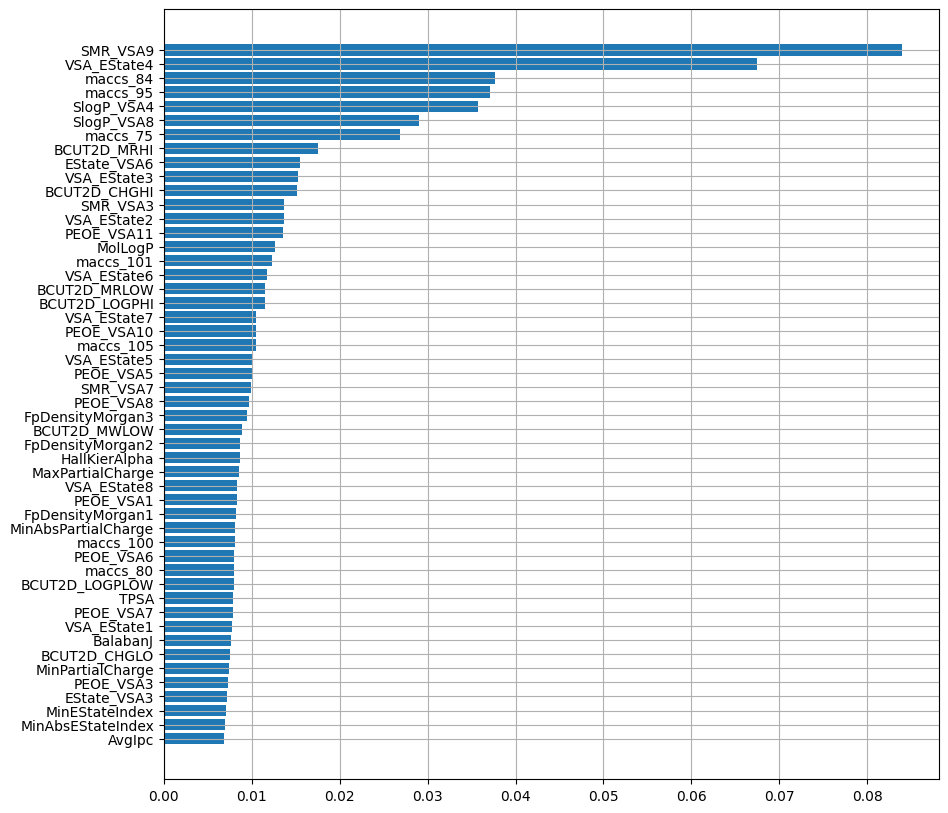

In [47]:
plt.figure(figsize=(10, 10))
plt.barh(width=list(reversed(rf_pipe[1].feature_importances_[indices[:50]])), y=list(reversed(col_np[indices[:50]])))
plt.grid()


In [48]:
pca_proba_preprocess = clone(rf_preprocess)
pca_proba_preprocess

ColumnTransformer(force_int_remainder_cols=False, n_jobs=-1,
                  remainder='passthrough',
                  transformers=[('preprocess', StandardScaler(),
                                 ['MaxAbsEStateIndex', 'MaxEStateIndex',
                                  'MinAbsEStateIndex', 'MinEStateIndex', 'qed',
                                  'SPS', 'MolWt', 'HeavyAtomMolWt',
                                  'ExactMolWt', 'NumValenceElectrons',
                                  'MaxPartialCharge', 'MinPartialCharge',
                                  'MaxAbsPartialCharge', 'MinAbsPartialCharge',
                                  'FpDensityMorgan1', 'FpDensityMorgan2',
                                  'FpDensityMorgan3', 'BCUT2D_MWHI',
                                  'BCUT2D_MWLOW', 'BCUT2D_CHGHI',
                                  'BCUT2D_CHGLO', 'BCUT2D_LOGPHI',
                                  'BCUT2D_LOGPLOW', 'BCUT2D_MRHI',
                                  'BCUT2D_MRLOW', 'AvgIpc', 'BalabanJ',
                                  'BertzCT', 'Chi0', 'Chi0n', ...])])

In [49]:
pca_proba = make_pipeline(
    pca_proba_preprocess,
    PCA()
)

In [50]:
pca_proba.fit(X_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(force_int_remainder_cols=False, n_jobs=-1,
                                   remainder='passthrough',
                                   transformers=[('preprocess',
                                                  StandardScaler(),
                                                  ['MaxAbsEStateIndex',
                                                   'MaxEStateIndex',
                                                   'MinAbsEStateIndex',
                                                   'MinEStateIndex', 'qed',
                                                   'SPS', 'MolWt',
                                                   'HeavyAtomMolWt',
                                                   'ExactMolWt',
                                                   'NumValenceElectrons',
                                                   'MaxPartialCharge',
                                                   'MinPartialCharge',
                                                   'MaxAbsPartialCharge',
                                                   'MinAbsPartialCharge',
                                                   'FpDensityMorgan1',
                                                   'FpDensityMorgan2',
                                                   'FpDensityMorgan3',
                                                   'BCUT2D_MWHI',
                                                   'BCUT2D_MWLOW',
                                                   'BCUT2D_CHGHI',
                                                   'BCUT2D_CHGLO',
                                                   'BCUT2D_LOGPHI',
                                                   'BCUT2D_LOGPLOW',
                                                   'BCUT2D_MRHI',
                                                   'BCUT2D_MRLOW', 'AvgIpc',
                                                   'BalabanJ', 'BertzCT',
                                                   'Chi0', 'Chi0n', ...])])),
                ('pca', PCA())])

In [51]:
variance_ratio = np.cumsum(pca_proba[1].explained_variance_ratio_)

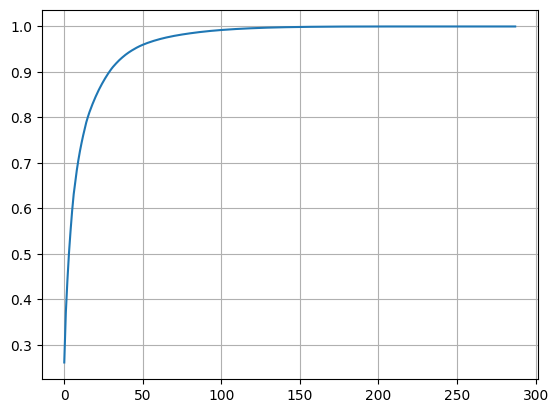

In [52]:
plt.plot(variance_ratio)
plt.grid()

In [53]:
num_dims_95 = np.argmax(variance_ratio >= 0.95) + 1
num_dims_95

46

In [54]:
num_dims_97 = np.argmax(variance_ratio >= 0.97) + 1
num_dims_97

60

With 60 dimensions we have 97% variance

In [55]:
num_dims = 60

Let's calclulate scores for this regerssor

In [56]:
cross_scores = dict()
scores = dict()

In [57]:
rf_cross_score = -cross_val_score(rf_pipe, X_train, y_train, scoring='neg_root_mean_squared_error', cv=5, n_jobs=-1)
cross_scores['random_forest'] = rf_cross_score.mean()
cross_scores

{'random_forest': 0.8202590861950082}

In [58]:
rf_pipe.fit(X_train, y_train)
scores['random_forest'] = rf_pipe.score(X_test, y_test)
scores

{'random_forest': 0.41472597612707995}

In [59]:
rf_pca_pipe = make_pipeline(
    clone(rf_preprocess),
    PCA(n_components=num_dims, random_state=42),
    RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1, criterion='squared_error')
)

In [60]:
rf_pca_pipe

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(force_int_remainder_cols=False, n_jobs=-1,
                                   remainder='passthrough',
                                   transformers=[('preprocess',
                                                  StandardScaler(),
                                                  ['MaxAbsEStateIndex',
                                                   'MaxEStateIndex',
                                                   'MinAbsEStateIndex',
                                                   'MinEStateIndex', 'qed',
                                                   'SPS', 'MolWt',
                                                   'HeavyAtomMolWt',
                                                   'ExactMolWt',
                                                   'NumValenceElectrons',
                                                   'MaxPartialCharge',
                                                   'MinPartialCharge',...
                                                   'FpDensityMorgan1',
                                                   'FpDensityMorgan2',
                                                   'FpDensityMorgan3',
                                                   'BCUT2D_MWHI',
                                                   'BCUT2D_MWLOW',
                                                   'BCUT2D_CHGHI',
                                                   'BCUT2D_CHGLO',
                                                   'BCUT2D_LOGPHI',
                                                   'BCUT2D_LOGPLOW',
                                                   'BCUT2D_MRHI',
                                                   'BCUT2D_MRLOW', 'AvgIpc',
                                                   'BalabanJ', 'BertzCT',
                                                   'Chi0', 'Chi0n', ...])])),
                ('pca', PCA(n_components=60, random_state=42)),
                ('randomforestregressor',
                 RandomForestRegressor(n_jobs=-1, random_state=42))])

In [61]:
rf_pca_pipe.steps

[('columntransformer',
  ColumnTransformer(force_int_remainder_cols=False, n_jobs=-1,
                    remainder='passthrough',
                    transformers=[('preprocess', StandardScaler(),
                                   ['MaxAbsEStateIndex', 'MaxEStateIndex',
                                    'MinAbsEStateIndex', 'MinEStateIndex', 'qed',
                                    'SPS', 'MolWt', 'HeavyAtomMolWt',
                                    'ExactMolWt', 'NumValenceElectrons',
                                    'MaxPartialCharge', 'MinPartialCharge',
                                    'MaxAbsPartialCharge', 'MinAbsPartialCharge',
                                    'FpDensityMorgan1', 'FpDensityMorgan2',
                                    'FpDensityMorgan3', 'BCUT2D_MWHI',
                                    'BCUT2D_MWLOW', 'BCUT2D_CHGHI',
                                    'BCUT2D_CHGLO', 'BCUT2D_LOGPHI',
                                    'BCUT2D_LOGPLOW', 'BCUT2

In [62]:
rf_pca_cross_score = -cross_val_score(rf_pca_pipe, X_train, y_train, scoring='neg_root_mean_squared_error', cv=5, n_jobs=-1)
cross_scores['pca_random_forest'] = rf_pca_cross_score.mean()
cross_scores

{'random_forest': 0.8202590861950082, 'pca_random_forest': 0.9051476176295281}

In [63]:
rf_pca_pipe.fit(X_train, y_train)
scores['pca_random_forest'] = rf_pca_pipe.score(X_test, y_test)
scores

{'random_forest': 0.41472597612707995,
 'pca_random_forest': 0.36136366809063014}

In [64]:
tpot_reg = TPOTRegressor(generations=10, population_size=50, random_state=42, n_jobs=-1, verbosity=2)

In [65]:
tpot_reg.fit(X_train, y_train)

Optimization Progress:   0%|          | 0/550 [00:00<?, ?pipeline/s]

/home/asasa/.tensor/lib/python3.12/site-packages/tpot/builtins/__init__.py:36: UserWarning: Warning: optional dependency `torch` is not available. - skipping import of NN models.
  warnings.warn("Warning: optional dependency `torch` is not available. - skipping import of NN models.")
/home/asasa/.tensor/lib/python3.12/site-packages/tpot/builtins/__init__.py:36: UserWarning: Warning: optional dependency `torch` is not available. - skipping import of NN models.
  warnings.warn("Warning: optional dependency `torch` is not available. - skipping import of NN models.")
/home/asasa/.tensor/lib/python3.12/site-packages/tpot/builtins/__init__.py:36: UserWarning: Warning: optional dependency `torch` is not available. - skipping import of NN models.
  warnings.warn("Warning: optional dependency `torch` is not available. - skipping import of NN models.")
/home/asasa/.tensor/lib/python3.12/site-packages/tpot/builtins/__init__.py:36: UserWarning: Warning: optional dependency `torch` is not available


Generation 1 - Current best internal CV score: -0.6258872938875905

Generation 2 - Current best internal CV score: -0.6258872938875905

Generation 3 - Current best internal CV score: -0.62477114063654

Generation 4 - Current best internal CV score: -0.62477114063654

Generation 5 - Current best internal CV score: -0.62477114063654

Generation 6 - Current best internal CV score: -0.6210803020542773

Generation 7 - Current best internal CV score: -0.6210803020542773


/home/asasa/.tensor/lib/python3.12/site-packages/tpot/builtins/__init__.py:36: UserWarning: Warning: optional dependency `torch` is not available. - skipping import of NN models.
  warnings.warn("Warning: optional dependency `torch` is not available. - skipping import of NN models.")
/home/asasa/.tensor/lib/python3.12/site-packages/tpot/builtins/__init__.py:36: UserWarning: Warning: optional dependency `torch` is not available. - skipping import of NN models.
  warnings.warn("Warning: optional dependency `torch` is not available. - skipping import of NN models.")
/home/asasa/.tensor/lib/python3.12/site-packages/tpot/builtins/__init__.py:36: UserWarning: Warning: optional dependency `torch` is not available. - skipping import of NN models.
  warnings.warn("Warning: optional dependency `torch` is not available. - skipping import of NN models.")
/home/asasa/.tensor/lib/python3.12/site-packages/tpot/builtins/__init__.py:36: UserWarning: Warning: optional dependency `torch` is not available


Generation 8 - Current best internal CV score: -0.6210803020542773

Generation 9 - Current best internal CV score: -0.6210803020542773

Generation 10 - Current best internal CV score: -0.6210803020542773

Best pipeline: ExtraTreesRegressor(RidgeCV(MinMaxScaler(input_matrix)), bootstrap=False, max_features=0.2, min_samples_leaf=1, min_samples_split=7, n_estimators=100)


TPOTRegressor(generations=10, n_jobs=-1, population_size=50, random_state=42,
              verbosity=2)

In [66]:
tpot_best = clone(tpot_reg.fitted_pipeline_)
tpot_best

Pipeline(steps=[('minmaxscaler', MinMaxScaler()),
                ('stackingestimator', StackingEstimator(estimator=RidgeCV())),
                ('extratreesregressor',
                 ExtraTreesRegressor(max_features=0.2, min_samples_split=7,
                                     random_state=42))])

In [67]:
tpot_best_cross_score = -cross_val_score(tpot_best, X_train, y_train, cv=5, scoring='neg_root_mean_squared_error', n_jobs=-1)
cross_scores['tpot_best'] = tpot_best_cross_score.mean()
cross_scores

{'random_forest': 0.8202590861950082,
 'pca_random_forest': 0.9051476176295281,
 'tpot_best': 0.7865917125152583}

In [68]:
tpot_best.fit(X_train, y_train)

Pipeline(steps=[('minmaxscaler', MinMaxScaler()),
                ('stackingestimator', StackingEstimator(estimator=RidgeCV())),
                ('extratreesregressor',
                 ExtraTreesRegressor(max_features=0.2, min_samples_split=7,
                                     random_state=42))])

In [69]:
scores['tpot_best'] = tpot_best.score(X_test, y_test)

In [70]:
scores

{'random_forest': 0.41472597612707995,
 'pca_random_forest': 0.36136366809063014,
 'tpot_best': 0.4546081380235407}

In [71]:
svm_preprocess = clone(rf_preprocess)

In [72]:
svr_pipe = make_pipeline(
    svm_preprocess,
    PCA(n_components=50),
    SVR(kernel='rbf')
)

In [73]:
pca_svr_cross_score = -cross_val_score(svr_pipe, X_train, y_train, cv=5, scoring='neg_root_mean_squared_error', n_jobs=-1)
cross_scores['pca_SVR'] = pca_svr_cross_score.mean()
cross_scores

{'random_forest': 0.8202590861950082,
 'pca_random_forest': 0.9051476176295281,
 'tpot_best': 0.7865917125152583,
 'pca_SVR': 0.8546171659706545}

In [74]:
svr_pipe.fit(X_train, y_train)
scores['pca_SVR'] = svr_pipe.score(X_test, y_test)
scores

{'random_forest': 0.41472597612707995,
 'pca_random_forest': 0.36136366809063014,
 'tpot_best': 0.4546081380235407,
 'pca_SVR': 0.4255507952494286}

We can see that random forest regeressor after PCA is best on cross validation on train dataset, succeded by tpot regeressor.
On test dataset, the best score has tpot regeressor, succeded by SVR. 
Score on test dataset is 50% worse than on train dataset crossvalidation, probably because the nature of the scaffold split.

In [76]:
pca_tpot_pipe = make_pipeline(
    MinMaxScaler(), PCA(n_components=num_dims, random_state=42), TPOTRegressor(generations=10, population_size=50, random_state=42, n_jobs=-1, verbosity=2)
)

In [77]:
pca_tpot_pipe.fit(X_train, y_train)

Optimization Progress:   0%|          | 0/550 [00:00<?, ?pipeline/s]


Generation 1 - Current best internal CV score: -0.7640060910035922

Generation 2 - Current best internal CV score: -0.7640060910035922

Generation 3 - Current best internal CV score: -0.7554398974428056

Generation 4 - Current best internal CV score: -0.7350316394835924

Generation 5 - Current best internal CV score: -0.7350316394835924

Generation 6 - Current best internal CV score: -0.7350316394835924

Generation 7 - Current best internal CV score: -0.7350316394835924

Generation 8 - Current best internal CV score: -0.7340293053451163

Generation 9 - Current best internal CV score: -0.7271690886022908

Generation 10 - Current best internal CV score: -0.7271690886022908

Best pipeline: RandomForestRegressor(ExtraTreesRegressor(RidgeCV(input_matrix), bootstrap=False, max_features=0.25, min_samples_leaf=2, min_samples_split=13, n_estimators=100), bootstrap=False, max_features=0.7000000000000001, min_samples_leaf=19, min_samples_split=16, n_estimators=100)


Pipeline(steps=[('minmaxscaler', MinMaxScaler()),
                ('pca', PCA(n_components=60, random_state=42)),
                ('tpotregressor',
                 TPOTRegressor(generations=10, n_jobs=-1, population_size=50,
                               random_state=42, verbosity=2))])

In [79]:
tpot_pca_best = clone(pca_tpot_pipe[2].fitted_pipeline_)
tpot_pca_best

Pipeline(steps=[('stackingestimator-1', StackingEstimator(estimator=RidgeCV())),
                ('stackingestimator-2',
                 StackingEstimator(estimator=ExtraTreesRegressor(max_features=0.25,
                                                                 min_samples_leaf=2,
                                                                 min_samples_split=13,
                                                                 random_state=42))),
                ('randomforestregressor',
                 RandomForestRegressor(bootstrap=False,
                                       max_features=0.7000000000000001,
                                       min_samples_leaf=19,
                                       min_samples_split=16,
                                       random_state=42))])

In [84]:
tpot_pca_best_pipe = make_pipeline(
    MinMaxScaler(), PCA(n_components=num_dims, random_state=42), tpot_pca_best
    )

In [85]:
tpot_pca_best_pipe

Pipeline(steps=[('minmaxscaler', MinMaxScaler()),
                ('pca', PCA(n_components=60, random_state=42)),
                ('pipeline',
                 Pipeline(steps=[('stackingestimator-1',
                                  StackingEstimator(estimator=RidgeCV())),
                                 ('stackingestimator-2',
                                  StackingEstimator(estimator=ExtraTreesRegressor(max_features=0.25,
                                                                                  min_samples_leaf=2,
                                                                                  min_samples_split=13,
                                                                                  random_state=42))),
                                 ('randomforestregressor',
                                  RandomForestRegressor(bootstrap=False,
                                                        max_features=0.7000000000000001,
                                                        min_samples_leaf=19,
                                                        min_samples_split=16,
                                                        random_state=42))]))])

In [86]:
tpot_pca_best_cross_score = -cross_val_score(tpot_pca_best_pipe, X_train, y_train, cv=5, scoring='neg_root_mean_squared_error', n_jobs=-1)
cross_scores['tpot_pca_best'] = tpot_best_cross_score.mean()
cross_scores

/home/asasa/.tensor/lib/python3.12/site-packages/tpot/builtins/__init__.py:36: UserWarning: Warning: optional dependency `torch` is not available. - skipping import of NN models.
  warnings.warn("Warning: optional dependency `torch` is not available. - skipping import of NN models.")
/home/asasa/.tensor/lib/python3.12/site-packages/tpot/builtins/__init__.py:36: UserWarning: Warning: optional dependency `torch` is not available. - skipping import of NN models.
  warnings.warn("Warning: optional dependency `torch` is not available. - skipping import of NN models.")
/home/asasa/.tensor/lib/python3.12/site-packages/tpot/builtins/__init__.py:36: UserWarning: Warning: optional dependency `torch` is not available. - skipping import of NN models.
  warnings.warn("Warning: optional dependency `torch` is not available. - skipping import of NN models.")
/home/asasa/.tensor/lib/python3.12/site-packages/tpot/builtins/__init__.py:36: UserWarning: Warning: optional dependency `torch` is not available

{'random_forest': 0.8202590861950082,
 'pca_random_forest': 0.9051476176295281,
 'tpot_best': 0.7865917125152583,
 'pca_SVR': 0.8546171659706545,
 'tpot_pca_best': 0.7865917125152583}

In [87]:
tpot_pca_best_pipe.fit(X_train, y_train)
scores['tpot_pca_best'] = tpot_pca_best_pipe.score(X_test, y_test)
scores

{'random_forest': 0.41472597612707995,
 'pca_random_forest': 0.36136366809063014,
 'tpot_best': 0.4546081380235407,
 'pca_SVR': 0.4255507952494286,
 'tpot_pca_best': 0.3885527480495157}